In [4]:
!pip install pycaret

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 252 kB 752 kB/s eta 0:00:01
     |████████████████████████████████| 365 kB 2.3 MB/s eta 0:00:01
     |████████████████████████████████| 66.1 MB 1.5 MB/s eta 0:00:01     |██████████████                  | 28.9 MB 1.4 MB/s eta 0:00:27     |██████████████████              | 37.4 MB 1.5 MB/s eta 0:00:20
     |████████████████████████████████| 269 kB 1.6 MB/s eta 0:00:01
     |████████████████████████████████| 9.9 MB 96 kB/s eta 0:00:011
     |████████████████████████████████| 258 kB 2.0 MB/s eta 0:00:01
     |████████████████████████████████| 148.9 MB 961 kB/s eta 0:00:01    |██▌                             | 11.6 MB 1.6 MB/s eta 0:01:26     |██▌                             | 11.7 MB 1.6 MB/s eta 0:01:26     |████████▍                       | 38.9 MB 1.0 MB/s eta 0:01:49     |███████████▌                    | 53.6 MB 1.4 MB/s eta 0:01:10
     |██████████████████████████████

In [1]:
from pycaret.classification import *
import pandas as pd 
train=pd.read_csv('train.csv',index_col=0)
test=pd.read_csv('test_x.csv',index_col=0)
sample=pd.read_csv('sample_submission.csv',index_col=0)

In [27]:
m_score=pd.read_csv('m_score.csv',index_col=0)

DataPrep Report
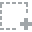
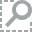
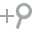
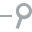
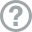
...
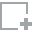
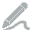
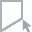
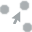
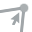

In [92]:
from dataprep.eda import create_report
create_report(train)

In [11]:
train.columns

Index(['QaA', 'QaE', 'QbA', 'QbE', 'QcA', 'QcE', 'QdA', 'QdE', 'QeA', 'QeE',
       'QfA', 'QfE', 'QgA', 'QgE', 'QhA', 'QhE', 'QiA', 'QiE', 'QjA', 'QjE',
       'QkA', 'QkE', 'QlA', 'QlE', 'QmA', 'QmE', 'QnA', 'QnE', 'QoA', 'QoE',
       'QpA', 'QpE', 'QqA', 'QqE', 'QrA', 'QrE', 'QsA', 'QsE', 'QtA', 'QtE',
       'age_group', 'education', 'engnat', 'familysize', 'gender', 'hand',
       'married', 'race', 'religion', 'tp01', 'tp02', 'tp03', 'tp04', 'tp05',
       'tp06', 'tp07', 'tp08', 'tp09', 'tp10', 'urban', 'voted', 'wf_01',
       'wf_02', 'wf_03', 'wr_01', 'wr_02', 'wr_03', 'wr_04', 'wr_05', 'wr_06',
       'wr_07', 'wr_08', 'wr_09', 'wr_10', 'wr_11', 'wr_12', 'wr_13'],
      dtype='object')

In [ ]:
Q_E(a~t) : 질문을 답할 때까지의 시간
age_group : 연령
education : 교육 수준 1=Less than high school, 2=High school, 3=University degree, 4=Graduate degree, 0=무응답
engnat : 모국어가 영어 1=Yes, 2=No, 0=무응답
familysize : 형제자매 수
gender : 성별 Male, Female
hand : 필기하는 손 1=Right, 2=Left, 3=Both, 0=무응답
married : 혼인 상태 1=Never married, 2=Currently married, 3=Previously married, 0=Other
race : 인종 Asian, Arab, Black, Indigenous Australian, Native American, White, Other
religion : 종교 Agnostic, Atheist, Buddhist, Christian_Catholic, Christian_Mormon, Christian_Protestant, Christian_Other, Hindu, Jewish, Muslim, Sikh, Other
tp__(01~07) : items were rated "I see myself as:" _____ such that
urban : 유년기의 거주 구역 1=Rural (country side), 2=Suburban, 3=Urban (town, city), 0=무응답
wr_(01~13) 실존하는 해당 단어의 정의을 앎
wf_(01~03)

In [2]:
train1=pd.concat([train[train.columns.difference(['gender', 'age_group', 'race', 'religion','voted'])] ,pd.get_dummies(train[['gender', 'age_group', 'race', 'religion']])],axis=1)

In [3]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
X=train1 #(45532, 100) w/o voted
scaler.fit(X)
X=scaler.transform(X)
test=pd.concat([test[test.columns.difference(['gender', 'age_group', 'race', 'religion'])] ,pd.get_dummies(test[['gender', 'age_group', 'race', 'religion']])],axis=1)
test=scaler.transform(test)

In [4]:
train=pd.concat([pd.DataFrame(X),train['voted']],axis=1)

In [5]:
import numpy as np
clf = setup(data = train, target = 'voted')

Setup Succesfully Completed!


,Description,Value
0,session_id,4788
1,Target Type,Binary
2,Label Encoded,"1: 0, 2: 1"
3,Original Data,"(45532, 101)"
4,Missing Values,False
5,Numeric Features,56
6,Categorical Features,44
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [ ]:
best3 = compare_models(sort = 'AUC', n_select = 3, include = ['gbc','lightgbm','gpc','ada','catboost']) 

# ROC : Receiver Operating Characteristic Curve
# AUC 높은 기준, top 3뽑기 AUC :  Area Under the Curve, 이진분류모델에서 모델 성능 평가할 때,분포가 서로 겹치지 않고 면적이 더 넓은 것이 더 좋은 모델

IntProgress(value=0, description='Processing: ', max=63)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,07:51:22
Status,. . . . . . . . . . . . . . . . . .,Fitting Fold 1 of 10
Estimator,. . . . . . . . . . . . . . . . . .,Gaussian Process Classifier
ETC,. . . . . . . . . . . . . . . . . .,Calculating ETC


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
0,Light Gradient Boosting Machine,0.6920,0.7640,0.6446,0.7563,0.6959,0.3879,0.3931,1.3466
1,Gradient Boosting Classifier,0.6926,0.7638,0.6468,0.7558,0.6970,0.3888,0.3937,17.9741


In [76]:
lgbm=create_model('lightgbm',learning_rate=0.1) 

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6950,0.7645,0.6424,0.7625,0.6973,0.3945,0.4004
1,0.6943,0.7647,0.6495,0.7571,0.6991,0.3922,0.3969
2,0.6943,0.7643,0.6418,0.7617,0.6966,0.3931,0.3990
3,0.6961,0.7662,0.6412,0.7650,0.6976,0.3968,0.4031
4,0.6970,0.7691,0.6418,0.7664,0.6986,0.3987,0.4051
5,0.6977,0.7655,0.6409,0.7678,0.6986,0.4003,0.4069
6,0.6977,0.7779,0.6518,0.7610,0.7022,0.3990,0.4039
7,0.6750,0.7440,0.6327,0.7359,0.6804,0.3537,0.3579
8,0.6848,0.7541,0.6582,0.7371,0.6954,0.3710,0.3736
9,0.7190,0.7858,0.6741,0.7818,0.7240,0.4409,0.4460


create_model_container: 1
master_model_container: 1
display_container: 1
LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=7996, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
create_model() succesfully completed......................................


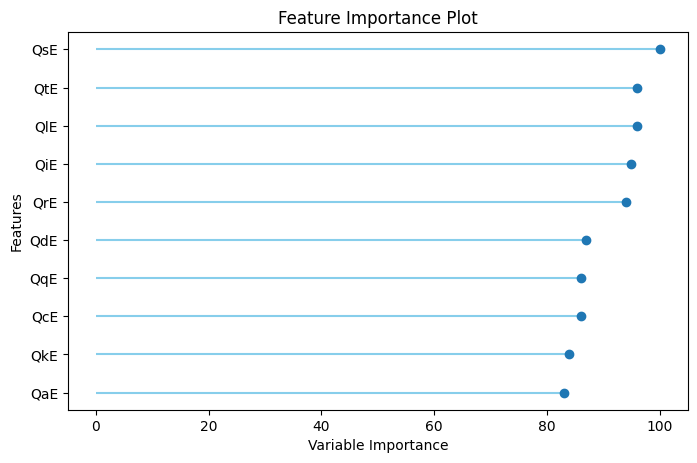

Visual Rendered Successfully
plot_model() succesfully completed......................................


In [98]:
plot_model(estimator=lgbm, plot='feature')

In [ ]:
tune_model=tune_model(lgbm) 

Initializing tune_model()
tune_model(estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=7996, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0), fold=10, round=4, n_iter=10, custom_grid=None, optimize=Accuracy, choose_better=False, verbose=True)
Checking exceptions
Preloading libraries
Preparing display monitor


IntProgress(value=0, description='Processing: ', max=16)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,08:50:59
Status,. . . . . . . . . . . . . . . . . .,Searching Hyperparameters
ETC,. . . . . . . . . . . . . . . . . .,Calculating ETC


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC


Copying training dataset
Creating estimator clone to inherit model parameters
Importing libraries
Checking base model
Base model : Light Gradient Boosting Machine
Defining folds
Declaring metric variables
Defining Hyperparameters
Initializing RandomizedSearchCV


In [77]:
gbc=create_model('gbc',learning_rate=0.1)       

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6950,0.7627,0.6488,0.7586,0.6994,0.3937,0.3987
1,0.6912,0.7652,0.6399,0.7577,0.6938,0.3868,0.3924
2,0.6919,0.7642,0.6367,0.7609,0.6933,0.3886,0.3949
3,0.6919,0.7640,0.6399,0.7589,0.6943,0.3882,0.3940
4,0.7012,0.7679,0.6380,0.7760,0.7002,0.4080,0.4158
5,0.6980,0.7688,0.6441,0.7663,0.6999,0.4006,0.4068
6,0.7043,0.7753,0.6492,0.7736,0.7060,0.4132,0.4196
7,0.6747,0.7438,0.6237,0.7403,0.6771,0.3541,0.3594
8,0.6872,0.7549,0.6562,0.7419,0.6964,0.3764,0.3794
9,0.7214,0.7882,0.6741,0.7859,0.7257,0.4460,0.4515


create_model_container: 2
master_model_container: 2
display_container: 2
GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=7996, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
create_model() succesfully completed......................................


In [ ]:
blended = blend_models(best3, fold = 10, method = 'soft') 

In [ ]:
## Gradient Boosting Classifier vs Light Gradient Boosting machine 차이
## soft voting

In [ ]:
predict_model(blended) 

In [ ]:
final_model=finalize_model(blended)

In [ ]:
#제출용 
test=pd.concat([test[test.columns.difference(['gender', 'age_group', 'race', 'religion'])],pd.get_dummies(test[['gender', 'age_group', 'race', 'religion']])],axis=1)
predict=predict_model(final_model,data=test) 

In [ ]:
submission=pd.DataFrame(data={'voted':predict['Score']})
submission.reset_index(inplace=True)
submission.to_csv('submission/submission3.csv',index=False)